#### Problem Statement : Predict next-day rain by training classification models on the target variable RainTomorrow.

### _Libraries and Dataset Loading_

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots

from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

In [138]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (8,6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'
matplotlib.rcParams["font.weight"] = "bold"

In [3]:
rain = pd.read_csv("D:/Primary Things/Projects/Rain in Australia/Dataset/weatherAUS.csv")

In [4]:
rain

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


##### The Data contains date, numerical, & categorical values. The prediction column is RainTomorrow.

In [5]:
rain.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

we overall come with loss in logistic regression model , if its prediction is high we penalize it high , if it is less we 
penalize it less and the loss in logistic regression is called cross entropy loss and then we optimize it.

labelled data mean we have some target

### _Let's check for Null values in the Dataset_

In [6]:
rain.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

##### We will drop all the rows for RainTomorrow & RainToday as they are prediction column & we have to build model based on that. We are also taking hypothesis that RainToday have a strong relation for preiciton of RainTomorrow.

In [7]:
rain.dropna(subset = ['RainToday','RainTomorrow'] , inplace = True)

In [8]:
rain.isnull().sum()

Date                 0
Location             0
MinTemp            468
MaxTemp            307
Rainfall             0
Evaporation      59694
Sunshine         66805
WindGustDir       9163
WindGustSpeed     9105
WindDir9am        9660
WindDir3pm        3670
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Cloud9am         52625
Cloud3pm         56094
Temp9am            656
Temp3pm           2624
RainToday            0
RainTomorrow         0
dtype: int64

### _Exploratory Data Analysis_

As the time constrain we will not analyze all the column.
Thus, we will look correlation of our prediction columns and take look on only those columns which have high correlation & columns we may find important.

But to do that first we have to map 0 & 1 value to our prediction column.

In [9]:
mapping_codes = {'No': 0, 'Yes': 1}
rain['RainToday'] = rain['RainToday'].map(mapping_codes)

In [10]:
mapping_codes = {'No': 0, 'Yes': 1}
rain['RainTomorrow'] = rain['RainTomorrow'].map(mapping_codes)

In [11]:
rain.sample(4)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
141850,2016-03-29,Darwin,25.8,34.1,0.0,8.0,10.0,SSW,37.0,E,...,70.0,63.0,1014.7,1011.0,1.0,2.0,30.2,32.0,0,0
71880,2013-04-26,Mildura,8.0,24.9,0.0,4.0,9.9,W,26.0,WNW,...,67.0,37.0,1026.5,1023.1,0.0,1.0,15.8,24.2,0,0
72968,2016-04-18,Mildura,4.8,25.8,0.0,4.0,9.8,NNW,22.0,E,...,52.0,22.0,1020.0,1016.1,0.0,6.0,14.4,25.4,0,0
143080,2015-04-16,Katherine,21.7,35.5,0.0,6.6,NaN,E,35.0,ESE,...,71.0,56.0,1015.7,1011.0,0.0,6.0,28.2,34.0,0,0


<AxesSubplot:>

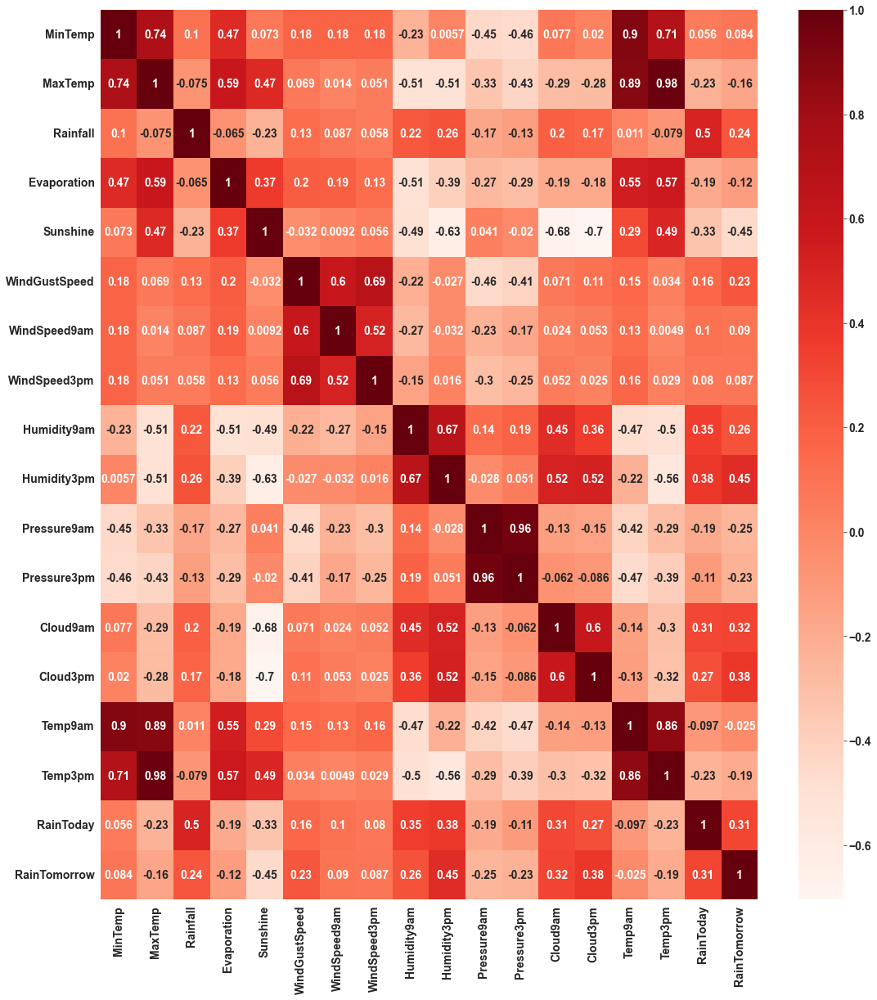

In [139]:
plt.figure(figsize=(18,20))
sns.heatmap( rain.corr() , annot = True , cmap = 'Reds')

#### Location

In [13]:
rain.Location.nunique()

49

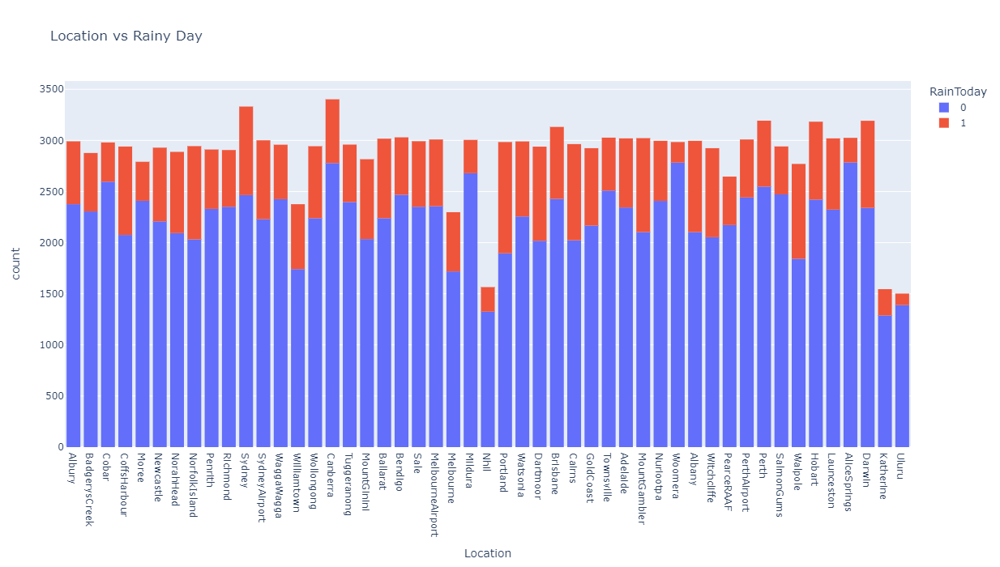

In [140]:
fig = px.histogram(rain , x='Location' , title='Location vs Rainy Day' , color='RainToday')
fig.update_layout(autosize = False , width=1000 , height = 700)

#### Temperature

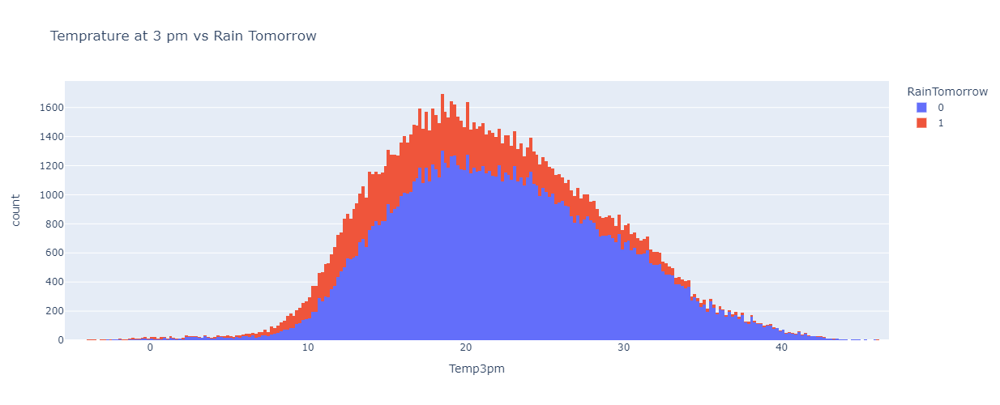

In [141]:
fig = px.histogram(rain,
                   x = 'Temp3pm',
                   title = ' Temprature at 3 pm vs Rain Tomorrow',
                   color = 'RainTomorrow')


fig.update_layout(autosize = False , width=800 , height = 500)
fig.show()

`Inference obtained from the graph :`
The graph seems to show gaussian curve.
We see in the lower temperature it is more likely to rain ( like 10-25)

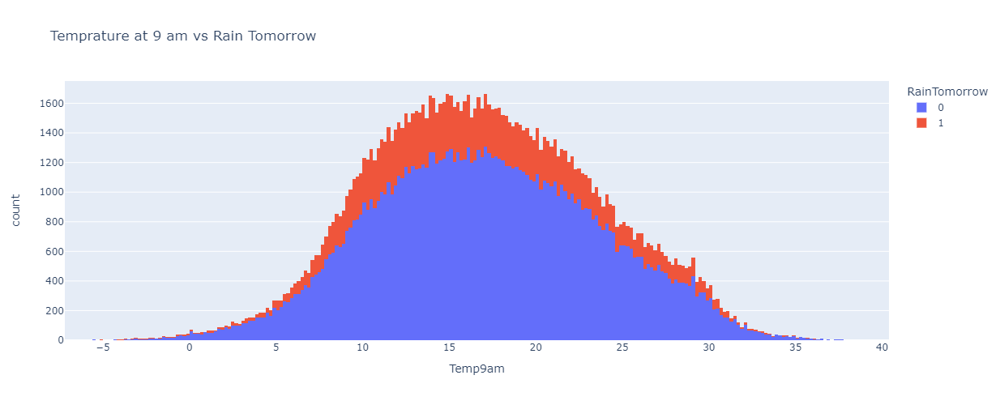

In [16]:
fig = px.histogram(rain,
                   x = 'Temp9am',
                   title = ' Temprature at 9 am vs Rain Tomorrow',
                   color = 'RainTomorrow')
fig.update_layout(autosize = False , width=800 , height = 500)
fig.show()

`Inference obtained from the graph :`
The same seems also true for Temperature at 9 am.

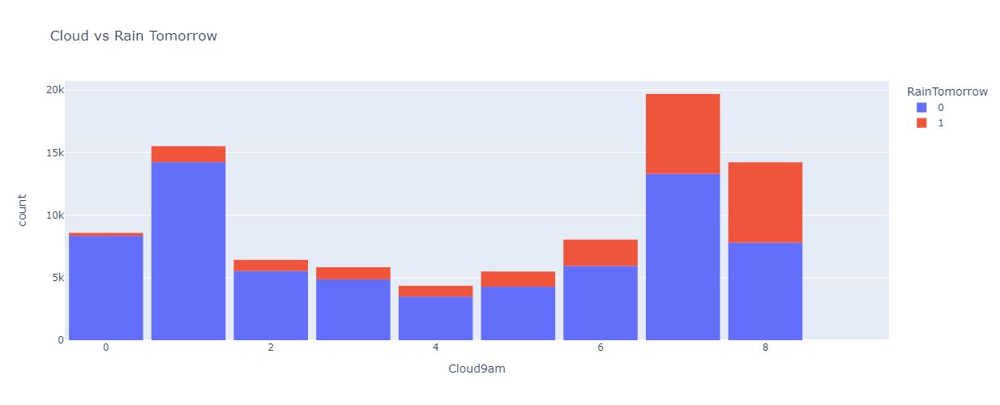

In [17]:
fig = px.histogram(rain,
                   x = 'Cloud9am',
                   title = ' Cloud vs Rain Tomorrow',
                   color = 'RainTomorrow')
fig.update_layout(autosize = False , width=800 , height = 500 , bargap=0.1)
fig.show()

Fraction of sky obscured by cloud at 9am. This is measured in "oktas"

`Inference obtained from the graph :`
It's seen for cloud count till 6 oktas no rainy days are more as compared to rainy day but after 6 oktas proportion of rainy and no rainy seems not true. 

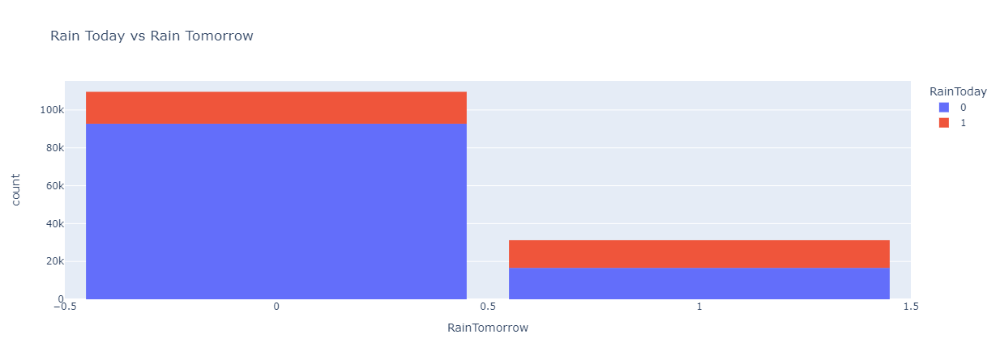

In [142]:
fig = px.histogram(rain,
                   x = 'RainTomorrow',
                   color = 'RainToday',
                   title = 'Rain Today vs Rain Tomorrow')

fig.update_layout( autosize = False , bargap = 0.1)
fig.show()

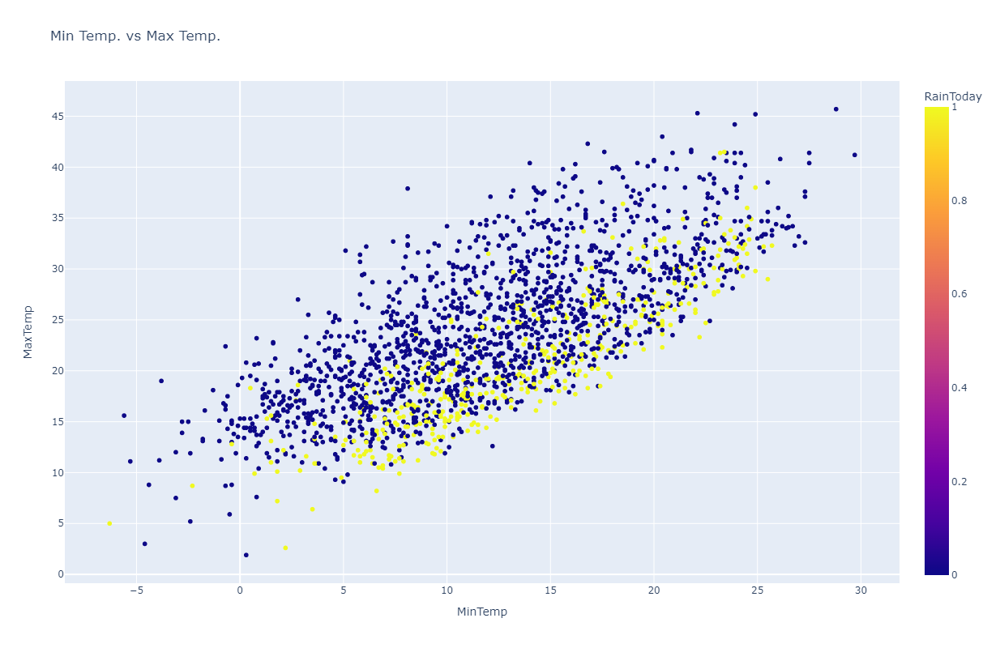

In [143]:
fig = px.scatter(rain.sample(2000), 
           title='Min Temp. vs Max Temp.',
           x='MinTemp', 
           y='MaxTemp', 
           color='RainToday')

fig.update_layout( autosize = False , height = 800 , width = 800)
fig.show()

`Inference obtained from the graph :`
When it rains their is less variation in temperature.

### _Dataset Splitting_

In [20]:
train_val_df,test_df = train_test_split(rain , test_size = 0.2 , random_state = 42)
train_df,val_df = train_test_split(train_val_df , test_size = 0.25 , random_state = 42)

In [21]:
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (84471, 23)
val_df.shape : (28158, 23)
test_df.shape : (28158, 23)


As we are working with date in this dataset , we will separtate dates for training , validation & test data. We want our model to learn from past dates to predict future.
First , we visualize the distribution of date.

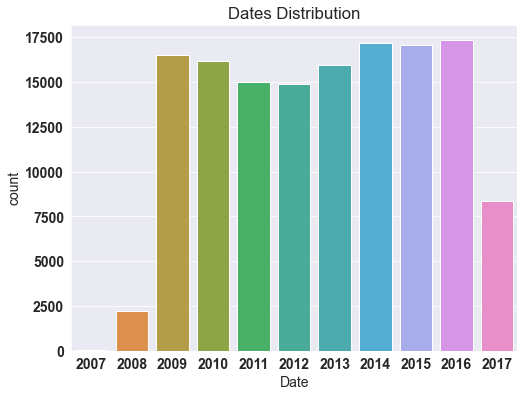

In [144]:
plt.title('Dates Distribution')
sns.countplot( x = pd.to_datetime(rain.Date).dt.year , data = rain);

##### We will take 2007-2014 for training set , year 2015 for validation set and year 2016-17 for test set.

In [23]:
year = pd.to_datetime(rain.Date).dt.year

train_df = rain[year < 2015]
val_df = rain[year == 2015]
test_df = rain[year > 2015]

In [24]:
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (97988, 23)
val_df.shape : (17089, 23)
test_df.shape : (25710, 23)


In [25]:
train_df.sample(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
71302,2011-07-29,Mildura,3.6,20.7,0.0,2.6,5.9,N,41.0,NNE,...,53.0,24.0,1023.5,1019.6,6.0,7.0,9.3,19.9,0,0
119340,2013-12-06,PerthAirport,18.2,33.8,0.4,10.4,10.9,NE,50.0,NNE,...,27.0,30.0,1006.6,1002.8,3.0,7.0,29.5,31.7,0,0
133182,2009-05-01,Launceston,3.7,16.5,4.6,0.0,NaN,NNW,50.0,NNW,...,96.0,46.0,1016.8,1017.6,NaN,NaN,12.8,16.1,1,0
61646,2010-04-10,Sale,9.2,22.7,0.0,2.6,2.0,WSW,37.0,W,...,87.0,61.0,1008.7,1005.7,7.0,8.0,15.1,20.2,0,0
16179,2012-01-08,Newcastle,18.7,31.2,0.0,NaN,NaN,NaN,NaN,NaN,...,75.0,NaN,NaN,NaN,2.0,NaN,24.0,NaN,0,0


In [26]:
val_df.sample(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
57252,2015-01-18,Ballarat,10.2,19.0,0.2,NaN,NaN,SSW,39.0,SSW,...,73.0,49.0,1015.6,1015.7,8.0,6.0,12.5,16.8,0,0
107759,2015-04-06,Woomera,11.4,19.8,0.0,48.0,NaN,SW,61.0,SSW,...,59.0,26.0,1014.2,1013.6,2.0,4.0,16.1,18.8,0,0
138251,2015-02-17,AliceSprings,21.8,38.8,0.0,14.8,11.8,E,43.0,SE,...,31.0,16.0,1011.5,1007.9,0.0,6.0,31.0,36.7,0,0
119772,2015-02-11,PerthAirport,19.7,37.0,0.0,10.6,12.4,ESE,50.0,E,...,45.0,22.0,1020.0,1015.4,4.0,1.0,25.0,36.8,0,0
74143,2015-03-12,Nhil,11.0,24.1,0.0,NaN,NaN,S,44.0,S,...,85.0,45.0,1020.6,1019.6,NaN,NaN,14.3,22.5,0,0


In [27]:
test_df.sample(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
80576,2016-04-30,Watsonia,16.2,23.5,5.8,2.2,8.4,N,44.0,NE,...,82.0,55.0,1014.8,1011.0,6.0,6.0,19.3,23.0,1,1
70257,2017-02-10,Melbourne,18.7,27.1,0.0,6.0,8.4,SSW,24.0,SSW,...,84.0,62.0,1012.2,1009.4,8.0,1.0,19.6,26.4,0,0
114582,2017-05-19,Witchcliffe,13.3,20.8,2.0,NaN,NaN,WNW,61.0,NW,...,70.0,66.0,1011.7,1008.7,NaN,NaN,18.8,18.1,1,1
90018,2016-11-16,Cairns,19.8,32.7,0.0,NaN,NaN,ESE,52.0,SSE,...,52.0,47.0,1015.0,1013.0,1.0,NaN,29.4,31.1,0,0
108529,2017-05-15,Woomera,11.4,25.0,0.0,4.6,NaN,NNE,44.0,NE,...,40.0,22.0,1019.7,1015.5,6.0,5.0,16.6,23.9,0,0


### _Identifying Input & Target Columns_

In [28]:
input_cols = list(train_df.columns)[1:-1]
target_cols = 'RainTomorrow'

In [29]:
print(input_cols)

['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday']


In [30]:
train_input = train_df[input_cols].copy()
train_target = train_df[target_cols].copy()

In [31]:
val_input = val_df[input_cols].copy()
val_target = val_df[target_cols].copy()

In [32]:
test_input = test_df[input_cols].copy()
test_target = test_df[target_cols].copy()

In [33]:
train_input.sample(5)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
82918,Dartmoor,6.5,14.5,0.2,0.4,8.4,N,52.0,N,N,...,24.0,96.0,67.0,1022.6,1017.0,NaN,NaN,8.3,14.2,0
15375,Newcastle,11.8,22.2,0.0,NaN,NaN,NaN,NaN,NW,NW,...,65.0,38.0,98.0,NaN,NaN,8.0,2.0,19.6,20.0,0
82301,Dartmoor,8.5,12.5,1.8,1.8,1.7,W,30.0,WNW,W,...,13.0,77.0,68.0,1021.9,1021.7,NaN,NaN,9.7,11.8,1
78600,Watsonia,5.8,18.3,8.8,2.6,1.3,N,57.0,NE,N,...,17.0,93.0,88.0,997.5,991.5,8.0,7.0,16.6,15.1,1
10396,CoffsHarbour,15.5,19.5,0.0,5.0,9.9,S,33.0,S,ESE,...,15.0,45.0,45.0,1020.1,1018.4,3.0,1.0,17.4,18.2,0


In [34]:
train_target.sample(5)

55239     0
31514     0
90469     0
128228    0
134282    0
Name: RainTomorrow, dtype: int64

#### Identifying numerical & categorical columns 

In [35]:
numerical_cols = train_input.select_dtypes(include = np.number).columns.tolist()
categorical_cols = train_input.select_dtypes('object').columns.tolist()

In [36]:
train_input[numerical_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
count,97674.000000,97801.000000,97988.000000,61657.000000,57942.000000,91160.000000,97114.000000,96919.000000,96936.000000,96872.000000,88876.000000,88857.000000,63000.000000,61966.000000,97414.000000,97392.000000,97988.000000
mean,12.007831,23.022202,2.372935,5.289991,7.609004,40.215873,14.092263,18.764608,68.628745,51.469547,1017.513734,1015.132352,4.302952,4.410677,16.835126,21.540138,0.224374
std,6.347175,6.984397,8.518819,3.952010,3.788813,13.697967,8.984203,8.872398,19.003097,20.756113,7.072510,6.997072,2.866634,2.693370,6.404586,6.831612,0.417172
min,-8.500000,-4.100000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,979.000000,0.000000,0.000000,-5.900000,-5.100000,0.000000
25%,7.500000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.800000,1010.400000,1.000000,2.000000,12.200000,16.600000,0.000000
50%,11.800000,22.400000,0.000000,4.600000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.500000,1015.100000,5.000000,5.000000,16.600000,20.900000,0.000000
75%,16.600000,27.900000,0.800000,7.200000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.300000,1019.900000,7.000000,7.000000,21.400000,26.200000,0.000000
max,33.900000,48.100000,371.000000,82.400000,14.300000,135.000000,87.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.100000,1.000000


In [37]:
train_input[categorical_cols].nunique()

Location       49
WindGustDir    16
WindDir9am     16
WindDir3pm     16
dtype: int64

### _Imputing Missing Numeric Data_

In [38]:
imputer = SimpleImputer( strategy = 'mean' )

In [39]:
rain[numerical_cols].isna().sum()

MinTemp            468
MaxTemp            307
Rainfall             0
Evaporation      59694
Sunshine         66805
WindGustSpeed     9105
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Cloud9am         52625
Cloud3pm         56094
Temp9am            656
Temp3pm           2624
RainToday            0
dtype: int64

In [40]:
train_input[numerical_cols] = imputer.fit_transform(train_input[numerical_cols])
val_input[numerical_cols] = imputer.fit_transform(val_input[numerical_cols])
test_input[numerical_cols] = imputer.fit_transform(test_input[numerical_cols])

In [41]:
train_input[numerical_cols].isna().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
dtype: int64

### _Scaling the Data_

In [42]:
scaler = MinMaxScaler()

In [43]:
train_input[numerical_cols] = scaler.fit_transform(train_input[numerical_cols])
val_input[numerical_cols] = scaler.fit_transform(val_input[numerical_cols])
test_input[numerical_cols] = scaler.fit_transform(test_input[numerical_cols])

In [44]:
train_input[numerical_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
count,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000
mean,0.483675,0.519582,0.006396,0.064199,0.532098,0.265239,0.161980,0.215685,0.686287,0.514695,0.611797,0.596243,0.478106,0.490075,0.493170,0.520315,0.224374
std,0.149457,0.133673,0.022962,0.038045,0.203740,0.102419,0.102805,0.101424,0.189008,0.206376,0.111333,0.109952,0.255395,0.237981,0.138521,0.133024,0.417172
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.377358,0.421456,0.000000,0.046117,0.524476,0.193798,0.080460,0.149425,0.570000,0.370000,0.543802,0.526403,0.333333,0.333333,0.392625,0.423828,0.000000
50%,0.478774,0.507663,0.000000,0.064199,0.532098,0.255814,0.149425,0.218391,0.690000,0.520000,0.611797,0.596243,0.478106,0.490075,0.488069,0.509766,0.000000
75%,0.591981,0.613027,0.002156,0.067961,0.643357,0.310078,0.218391,0.275862,0.830000,0.650000,0.682645,0.665017,0.666667,0.666667,0.590022,0.609375,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### _Encoding Categorical Data_

In [45]:
encoder = OneHotEncoder( sparse = False , handle_unknown = 'ignore')

In [46]:
encoder.fit(rain[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse=False)

In [47]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))
print(encoded_cols)

['Location_Adelaide', 'Location_Albany', 'Location_Albury', 'Location_AliceSprings', 'Location_BadgerysCreek', 'Location_Ballarat', 'Location_Bendigo', 'Location_Brisbane', 'Location_Cairns', 'Location_Canberra', 'Location_Cobar', 'Location_CoffsHarbour', 'Location_Dartmoor', 'Location_Darwin', 'Location_GoldCoast', 'Location_Hobart', 'Location_Katherine', 'Location_Launceston', 'Location_Melbourne', 'Location_MelbourneAirport', 'Location_Mildura', 'Location_Moree', 'Location_MountGambier', 'Location_MountGinini', 'Location_Newcastle', 'Location_Nhil', 'Location_NorahHead', 'Location_NorfolkIsland', 'Location_Nuriootpa', 'Location_PearceRAAF', 'Location_Penrith', 'Location_Perth', 'Location_PerthAirport', 'Location_Portland', 'Location_Richmond', 'Location_Sale', 'Location_SalmonGums', 'Location_Sydney', 'Location_SydneyAirport', 'Location_Townsville', 'Location_Tuggeranong', 'Location_Uluru', 'Location_WaggaWagga', 'Location_Walpole', 'Location_Watsonia', 'Location_Williamtown', 'Loca

In [48]:
train_input[encoded_cols] = encoder.transform(train_input[categorical_cols])
val_input[encoded_cols] = encoder.transform(val_input[categorical_cols])
test_input[encoded_cols] = encoder.transform(test_input[categorical_cols])

C:\Users\HP\AppData\Local\Temp\ipykernel_5508\121031197.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\HP\AppData\Local\Temp\ipykernel_5508\121031197.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\HP\AppData\Local\Temp\ipykernel_5508\121031197.py:2: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `new

In [49]:
train_input.shape

(97988, 121)

### _Saving Processed Data to Disk_

In [50]:
!pip install pyarrow --quiet

In [51]:
train_input.to_parquet('train_input.parquet')
val_input.to_parquet('val_input.parquet')
test_input.to_parquet('test_input.partquet')

In [52]:
pd.DataFrame(train_target).to_parquet('train_target.parquet')
pd.DataFrame(val_target).to_parquet('val_target.parquet')
pd.DataFrame(test_target).to_parquet('test_target.parquet')

In [53]:
train_target = pd.read_parquet('train_target.parquet')[target_cols]

In [54]:
train_target.shape

(97988,)

### _Training Logistic Regression Model_

In [55]:
model = LogisticRegression( solver = 'liblinear' )

In [56]:
model.fit(train_input[numerical_cols + encoded_cols], train_target)

LogisticRegression(solver='liblinear')

### _Making Predictions and Evaluation_

In [57]:
X_train = train_input[numerical_cols + encoded_cols]
X_val = val_input[numerical_cols + encoded_cols]
X_test = test_input[numerical_cols + encoded_cols]

In [58]:
train_preds = model.predict(X_train)

In [59]:
train_preds

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [60]:
train_target

0         0
1         0
2         0
3         0
4         0
         ..
144548    0
144549    0
144550    0
144551    0
144552    0
Name: RainTomorrow, Length: 97988, dtype: int64

In [61]:
accuracy_score(train_target, train_preds)

0.8519614646691431

In [79]:
def predict_and_plot(inputs, targets, name=''):
    preds = model.predict(inputs)
    
    accuracy = accuracy_score(targets, preds)
    print("Accuracy: {:.2f}%".format(accuracy * 100))
    
    cf = confusion_matrix(targets, preds, normalize='true')
    plt.figure()
    sns.heatmap(cf, annot=True)
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.title('{} Confusion Matrix'.format(name));
    
    return preds

Accuracy: 85.20%


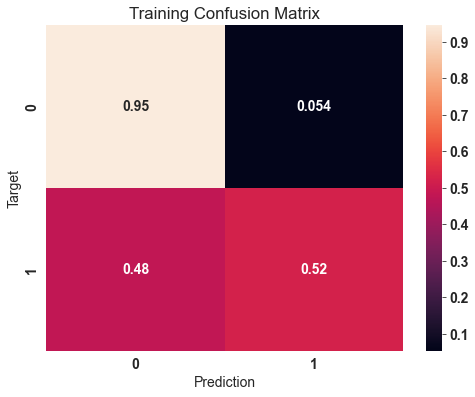

In [80]:
train_preds = predict_and_plot(X_train, train_target, 'Training')

Accuracy: 85.15%


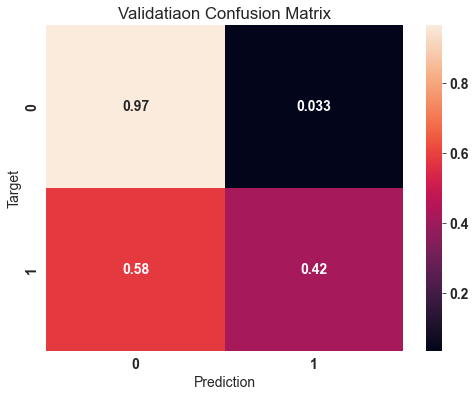

In [75]:
val_preds = predict_and_plot(X_val, val_target, 'Validatiaon')

Accuracy: 84.17%


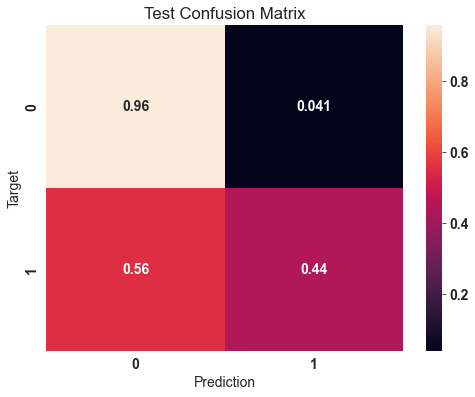

In [76]:
test_preds = predict_and_plot(X_test, test_target, 'Test')

### _Prediction Based on Single Input_

In [117]:
def predict_input(single_input):
    input_df = pd.DataFrame([single_input])
    input_df[numerical_cols] = imputer.transform(input_df[numerical_cols])
    input_df[numerical_cols] = scaler.transform(input_df[numerical_cols])
    input_df[encoded_cols] = encoder.transform(input_df[categorical_cols])
    X_input = input_df[numerical_cols + encoded_cols]
    pred = model.predict(X_input)[0]
    prob = model.predict_proba(X_input)[0][list(model.classes_).index(pred)]
    return pred, prob

We can now use this function to make predictions for individual inputs.

In [123]:
new_input = {'Date': '2021-06-19',
             'Location': 'Launceston',
             'MinTemp': 26.2,
             'MaxTemp': 31.2,
             'Rainfall': 10.2,
             'Evaporation': 4.2,
             'Sunshine': np.nan,
             'WindGustDir': 'NNW',
             'WindGustSpeed': 52.0,
             'WindDir9am': 'NW',
             'WindDir3pm': 'NNE',
             'WindSpeed9am': 13.0,
             'WindSpeed3pm': 20.0,
             'Humidity9am': 89.0,
             'Humidity3pm': 58.0,
             'Pressure9am': 1004.8,
             'Pressure3pm': 1001.5,
             'Cloud9am': 5.0,
             'Cloud3pm': 5.0,
             'Temp9am': 25.7,
             'Temp3pm': 33.0,
             'RainToday': '1'}

In [124]:
predict_input(new_input)

C:\Users\HP\AppData\Local\Temp\ipykernel_5508\2363771375.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\HP\AppData\Local\Temp\ipykernel_5508\2363771375.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



(1, 0.6581968434303967)

### _Saving and Loading Trained Models_

In [130]:
import joblib

In [131]:
aussie_rain = {
    'model': model,
    'imputer': imputer,
    'scaler': scaler,
    'encoder': encoder,
    'input_cols': input_cols,
    'target_cols': target_cols,
    'numerical_cols': numerical_cols,
    'categorical_cols': categorical_cols,
    'encoded_cols': encoded_cols
}

In [132]:
joblib.dump(aussie_rain, 'aussie_rain.joblib')

['aussie_rain.joblib']

In [134]:
aussie_rain2 = joblib.load('aussie_rain.joblib')

In [136]:
test_preds2 = aussie_rain2['model'].predict(X_test)
accuracy_score(test_target, test_preds2)

0.841656942823804